In [2]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import svm
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from keras.callbacks import EarlyStopping, ModelCheckpoint

import tensorflow as tf
import keras
import glob
import cv2
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Conv2DTranspose, AveragePooling2D, Lambda, Reshape
from keras.layers.normalization import BatchNormalization
from keras.layers import LSTM, Input, TimeDistributed
from keras.models import Model
from keras.optimizers import RMSprop, SGD
from keras import backend as K

import os
print(os.listdir("Manzanas"))

Using TensorFlow backend.
C:\Users\Miguel\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\Miguel\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\Miguel\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\Miguel\Anaconda3\lib\site-packages\tensorflow\python\framework\dtype

['testManzanas', 'testOrange', 'TestPlatanos', 'trainManzanas', 'trainOrange', 'TrainPlatanos']


# Cargando y acomodando datos de entrenamiento


In [3]:
fruit_images = []
labels = [] 
for fruit_dir_path in glob.glob("Manzanas/TrainPlatanos/*"):
    fruit_label = fruit_dir_path.split("/")[-1]
    for image_path in glob.glob(os.path.join(fruit_dir_path, "*.png")):
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)
        
        image = cv2.resize(image, (100, 100))
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        
        fruit_images.append(image)
        labels.append(fruit_label)
fruit_images = np.array(fruit_images)
labels = np.array(labels)

In [4]:
label_to_id_dict = {v:i for i,v in enumerate(np.unique(labels))}
id_to_label_dict = {v: k for k, v in label_to_id_dict.items()}

In [5]:
id_to_label_dict

{0: 'TrainPlatanos\\freshbanana', 1: 'TrainPlatanos\\rottenbanana'}

In [6]:
label_ids = np.array([label_to_id_dict[x] for x in labels])

In [7]:
label_ids.shape

(3805,)

In [8]:
scaler = StandardScaler()

In [9]:
images_scaled = scaler.fit_transform([i.flatten() for i in fruit_images])

In [10]:
pca = PCA(n_components=50)
pca_result = pca.fit_transform(images_scaled)

In [11]:
tsne = TSNE(n_components=2, perplexity=40.0)
tsne_result = tsne.fit_transform(pca_result)
tsne_result_scaled = StandardScaler().fit_transform(tsne_result)

# Definiendo visualización para las imagenes

In [142]:
def plot_image_grid(images, nb_rows, nb_cols, figsize=(5, 5)):
    assert len(images) == nb_rows*nb_cols, "Number of images should be the same as (nb_rows*nb_cols)"
    fig, axs = plt.subplots(nb_rows, nb_cols, figsize=figsize)
    
    n = 0
    for i in range(0, nb_rows):
        for j in range(0, nb_cols):
            # axs[i, j].xaxis.set_ticklabels([])
            # axs[i, j].yaxis.set_ticklabels([])
            axs[i, j].axis('off')
            axs[i, j].imshow(images[n])
            n += 1

def visualize_scatter_with_images(X_2d_data, images, figsize=(45,45), image_zoom=1):
    fig, ax = plt.subplots(figsize=figsize)
    artists = []
    for xy, i in zip(X_2d_data, images):
        x0, y0 = xy
        img = OffsetImage(i, zoom=image_zoom)
        ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(X_2d_data)
    ax.autoscale()
    plt.show()

def visualize_scatter(data_2d, label_ids, id_to_label_dict=None, figsize=(20,20)):
    if not id_to_label_dict:
        id_to_label_dict = {v:i for i,v in enumerate(np.unique(label_ids))}
    
    plt.figure(figsize=figsize)
    plt.grid()
    
    nb_classes = len(np.unique(label_ids))
    
    cmap = plt.cm.get_cmap("jet", nb_classes)
    
    for i, label_id in enumerate(np.unique(label_ids)):
        plt.scatter(data_2d[np.where(label_ids == label_id), 0],
                    data_2d[np.where(label_ids == label_id), 1],
                    marker='o',
                    c= cmap(i),
                    linewidth='5',
                    alpha=0.8,
                    label=id_to_label_dict[label_id])
    #plt.legend(loc='best')
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5),
          fancybox=True, shadow=True, ncol=1, fontsize=figsize[0])

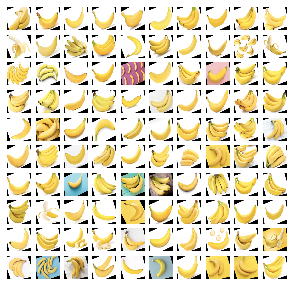

In [143]:
plot_image_grid(fruit_images[0:100], 10, 10)

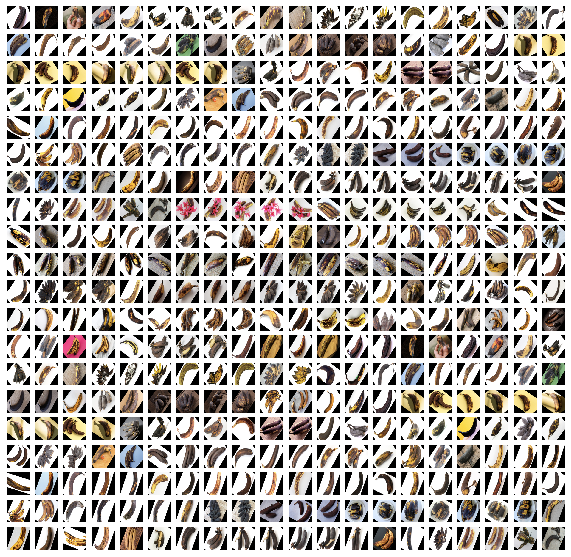

In [144]:
plot_image_grid(fruit_images[2000:2400], 20, 20, figsize=(10,10))

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


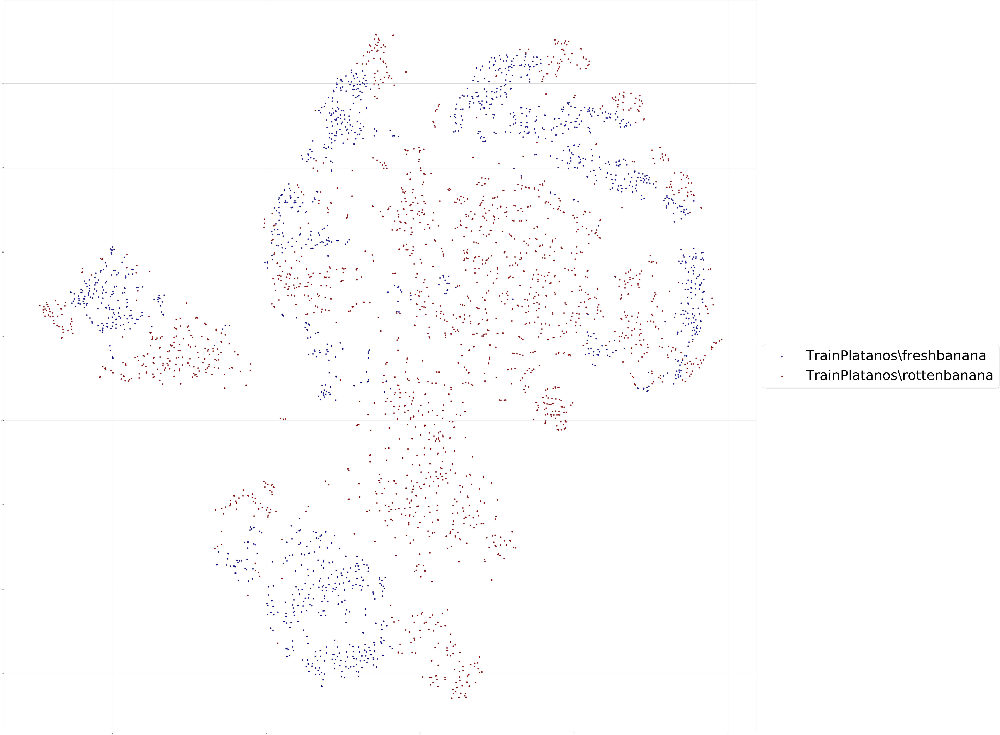

In [145]:
visualize_scatter(tsne_result_scaled, label_ids, id_to_label_dict, figsize=(100, 100))

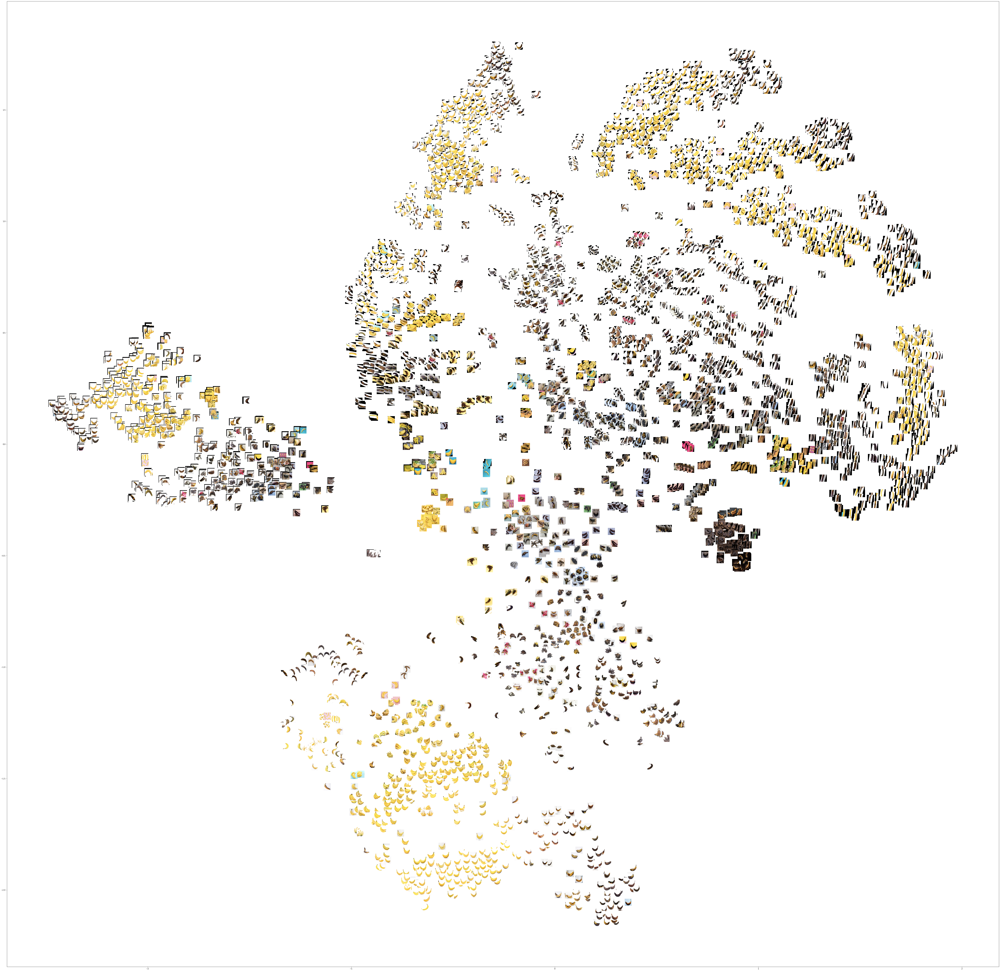

In [146]:
visualize_scatter_with_images(tsne_result_scaled, fruit_images, image_zoom=0.4, figsize=(100, 100))

In [160]:
fruit_images.shape, label_ids.shape, labels.shape

((3805, 100, 100, 3), (3805,), (3805,))

# Cargando datos de validación

In [12]:
validation_fruit_images = []
validation_labels = [] 
for fruit_dir_path in glob.glob("Manzanas/TestPlatanos/*"):
    fruit_label = fruit_dir_path.split("/")[-1]
    for image_path in glob.glob(os.path.join(fruit_dir_path, "*.png")):
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)
        
        image = cv2.resize(image, (100, 100))
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        
        validation_fruit_images.append(image)
        validation_labels.append(fruit_label)
validation_fruit_images = np.array(validation_fruit_images)
validation_labels = np.array(validation_labels)

In [13]:
label_to_id_dict2 = {v:i for i,v in enumerate(np.unique(validation_labels))}
id_to_label_dict2 = {v: k for k, v in label_to_id_dict2.items()}

In [14]:
id_to_label_dict2

{0: 'TestPlatanos\\freshbanana', 1: 'TestPlatanos\\rottenbanana'}

In [15]:
validation_label_ids = np.array([label_to_id_dict2[x] for x in validation_labels])

In [16]:
validation_fruit_images.shape

(911, 100, 100, 3)

In [17]:
validation_label_ids.shape

(911,)

# Separando datos de train y test para utilizar

In [18]:
X_train, X_test = fruit_images, validation_fruit_images
Y_train, Y_test = label_ids, validation_label_ids

#Normalizando
X_train = X_train/255
X_test = X_test/255


X_flat_train = X_train.reshape(X_train.shape[0], 100*100*3)
X_flat_test = X_test.reshape(X_test.shape[0], 100*100*3)

Y_train = keras.utils.to_categorical(Y_train, 2)
Y_test = keras.utils.to_categorical(Y_test, 2)

print('Original Sizes:', X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)
print('Flattened:', X_flat_train.shape, X_flat_test.shape)

Original Sizes: (3805, 100, 100, 3) (911, 100, 100, 3) (3805, 2) (911, 2)
Flattened: (3805, 30000) (911, 30000)


(100, 100, 3)


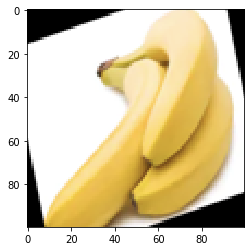

In [19]:
print(X_train[0].shape)
plt.imshow(X_train[0])
plt.show()

# Definiendo matriz de confusion y curva roc

In [20]:
# Código para graficar matriz de confusion

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                         title='Matriz de confusion',
                         cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    
    if normalize:
        cm=cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalizando matriz de confusion")
    else:
        print("La matriz de confusion sin normalizar")
    
    print(cm)
    
# QUEDA CORRIDO EL GRAFICO
#    thresh = cm.max() / 2.
#    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
#        plt.text(j, i, cm[i,j],
#                 horizontalalignment = "center",
#                 color= "white" if cm[i, j] > thresh else "black")
#    
#    plt.tight_layout()
#    plt.ylabel('True label')
#    plt.xlabel('Predict label')

In [21]:
#Matriz de conf
import itertools
from sklearn.metrics import roc_curve, auc, confusion_matrix
##CURVA ROC
import seaborn as sns
# roc curve and auc score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [22]:
#DEFINIENDO LA CURVA ROCK
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

In [188]:
X_flat_train.shape[1]

30000

# Probando la primera red neuronal simple

In [193]:
model_dense = Sequential()

# Usando funcion de activacion RELU
model_dense.add(Dense(128, activation='relu', input_shape=(X_flat_train.shape[1],)))
# Capa Dropout para evitar sobreajuste y eliminar caracteristicas
model_dense.add(Dropout(0.1))
model_dense.add(Dense(64, activation='relu'))
model_dense.add(Dropout(0.1))
# El numero de unidades tiene que ser igual al numero de clases
model_dense.add(Dense(2, activation='softmax'))

model_dense.summary()

#-----------------------------aplicando early stopping-------
epochs_to_wait_for_improve = 3
early_stopping_callback = EarlyStopping(monitor='val_loss', 
                                        patience=epochs_to_wait_for_improve)

checkpoint_callback = ModelCheckpoint('early.h5', 
                                      monitor='val_loss', 
                                      verbose=1, 
                                      save_best_only=True, 
                                      mode='min')
#-----------------------------------------------------------------------

model_dense.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(),
              metrics=['accuracy'])

history_dense = model_dense.fit(X_flat_train, Y_train,
                          batch_size=64,
                          epochs=5,
                          verbose=1,
                          validation_data=(X_flat_test, Y_test),
                          callbacks=[early_stopping_callback, checkpoint_callback])
score = model_dense.evaluate(X_flat_test, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_57 (Dense)             (None, 128)               3840128   
_________________________________________________________________
dropout_44 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_58 (Dense)             (None, 64)                8256      
_________________________________________________________________
dropout_45 (Dropout)         (None, 64)                0         
_________________________________________________________________
dense_59 (Dense)             (None, 2)                 130       
Total params: 3,848,514
Trainable params: 3,848,514
Non-trainable params: 0
_________________________________________________________________
Train on 3805 samples, validate on 911 samples
Epoch 1/5
3805/3805 [==============================] - 17s 4ms/step - loss: 6.6060 - 

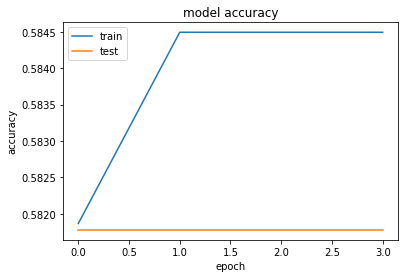

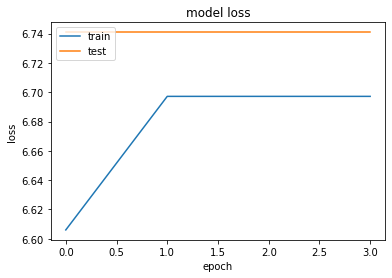

In [194]:
# summarize history for accuracy
plt.plot(history_dense.history['acc'])
plt.plot(history_dense.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_dense.history['loss'])
plt.plot(history_dense.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [239]:
prediccion_dense = model_dense.predict(X_flat_test)

In [240]:
probs_dense = model_dense.predict_proba(X_flat_test)

In [241]:
clases_dense = model_dense.predict_classes(X_flat_test)

In [249]:
cm_dense= confusion_matrix(Y_test.argmax(axis=1), clases_dense)

La matriz de confusion sin normalizar
[[  0 381]
 [  0 530]]


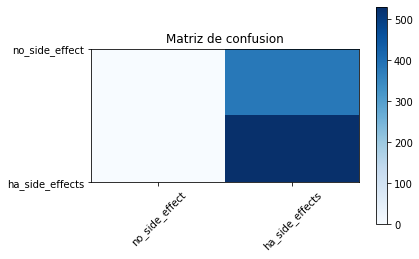

In [250]:
cm_plot_label = ['no_side_effect','ha_side_effects']
plot_confusion_matrix(cm_dense, cm_plot_label, title='Matriz de confusion')

In [251]:
probs_dense = probs_dense[:, 0]

In [252]:
auc_dense = roc_auc_score(Y_test.argmax(axis=1), probs_dense)

In [253]:
fpr, tpr, thresholds = roc_curve(Y_test.argmax(axis=1), probs_dense)

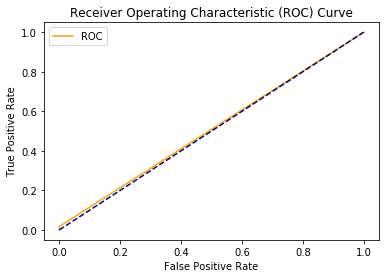

In [254]:
plot_roc_curve(fpr, tpr)

# Segunda red neuronal un poco mas profunda

In [204]:
model_deep = Sequential()

model_deep.add(Dense(256, activation='relu', input_shape=(X_flat_train.shape[1],)))

model_deep.add(Dropout(0.05))
model_deep.add(Dense(128, activation='relu'))
model_deep.add(Dropout(0.05))
model_deep.add(Dense(128, activation='relu'))
model_deep.add(Dropout(0.05))
model_deep.add(Dense(128, activation='relu'))
model_deep.add(Dropout(0.05))
model_deep.add(Dense(128, activation='relu'))
model_deep.add(Dropout(0.05))

model_deep.add(Dense(2, activation='softmax'))

model_deep.summary()

#-----------------------------aplicando early stopping-------
epochs_to_wait_for_improve = 5
early_stopping_callback = EarlyStopping(monitor='val_loss', 
                                        patience=epochs_to_wait_for_improve)

checkpoint_callback = ModelCheckpoint('early.h5', 
                                      monitor='val_loss', 
                                      verbose=1, 
                                      save_best_only=True, 
                                      mode='min')
#-----------------------------------------------------------------------

model_deep.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(),
              metrics=['accuracy'])

history_deep = model_deep.fit(X_flat_train, Y_train,
                          batch_size=128,
                          epochs=10,
                          verbose=1,
                          validation_data=(X_flat_test, Y_test),
                          callbacks=[early_stopping_callback, checkpoint_callback])
score = model_deep.evaluate(X_flat_test, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_60 (Dense)             (None, 256)               7680256   
_________________________________________________________________
dropout_46 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_61 (Dense)             (None, 128)               32896     
_________________________________________________________________
dropout_47 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_62 (Dense)             (None, 128)               16512     
_________________________________________________________________
dropout_48 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_63 (Dense)             (None, 128)               16512     
__________

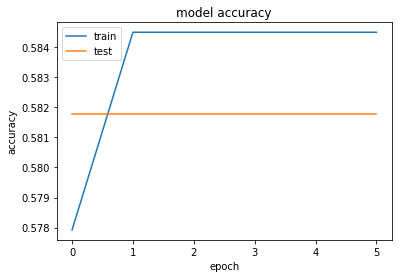

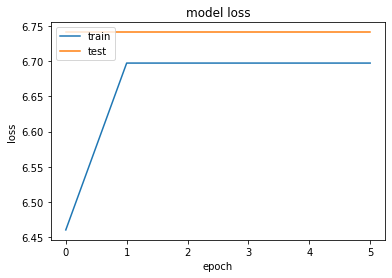

In [206]:
# summarize history for accuracy
plt.plot(history_deep.history['acc'])
plt.plot(history_deep.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_deep.history['loss'])
plt.plot(history_deep.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

La matriz de confusion sin normalizar
[[  0 381]
 [  0 530]]


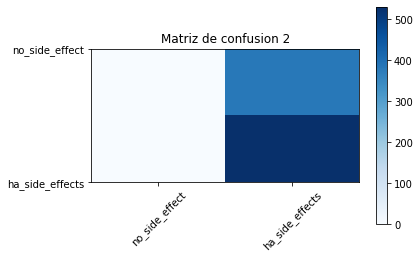

In [226]:
prediccion_deep = model_deep.predict(X_flat_test)
probs_deep = model_deep.predict_proba(X_flat_test)
clases_deep = model_deep.predict_classes(X_flat_test)


cm_deep= confusion_matrix(Y_test.argmax(axis=1), clases_deep)
cm_plot_label_deep = ['no_side_effect','ha_side_effects']
plot_confusion_matrix(cm_deep, cm_plot_label_deep, title='Matriz de confusion 2')

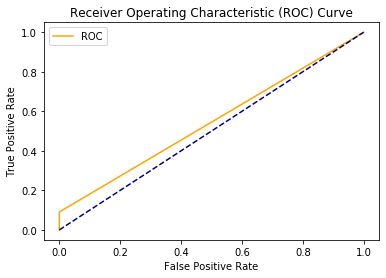

In [228]:
probs_deep = probs_deep[:, 0]
auc_deep = roc_auc_score(Y_test.argmax(axis=1), probs_deep)
fpr_deep, tpr_deep, thresholds = roc_curve(Y_test.argmax(axis=1), probs_deep)
plot_roc_curve(fpr_deep, tpr_deep)

# Tercera Red Neuronal aplicando Conv2d

In [127]:
model_cnn = Sequential()

model_cnn.add(Conv2D(16, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(100, 100, 3)))
model_cnn.add(Conv2D(32, (3, 3), activation='relu'))
model_cnn.add(MaxPooling2D(pool_size=(2, 2)))
model_cnn.add(Dropout(0.25))
model_cnn.add(Flatten())
model_cnn.add(Dense(64, activation='relu'))
model_cnn.add(Dropout(0.5))
model_cnn.add(Dense(2, activation='softmax'))

model_cnn.summary()



_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 98, 98, 16)        448       
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 96, 96, 32)        4640      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 48, 48, 32)        0         
_________________________________________________________________
dropout_27 (Dropout)         (None, 48, 48, 32)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 73728)             0         
_________________________________________________________________
dense_34 (Dense)             (None, 64)                4718656   
_________________________________________________________________
dropout_28 (Dropout)         (None, 64)                0         
__________

In [128]:
#-----------------------------aplicando early stopping-------
epochs_to_wait_for_improve = 4
early_stopping_callback = EarlyStopping(monitor='val_loss', 
                                        patience=epochs_to_wait_for_improve)

checkpoint_callback = ModelCheckpoint('early.h5', 
                                      monitor='val_loss', 
                                      verbose=1, 
                                      save_best_only=True, 
                                      mode='min')
#-----------------------------------------------------------------------

model_cnn.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

history_cnn= model_cnn.fit(X_train, Y_train,
          batch_size=128,
          epochs=25,
          verbose=1,
          validation_data=(X_test, Y_test),
          callbacks=[early_stopping_callback, checkpoint_callback])
score = model_cnn.evaluate(X_test, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 3805 samples, validate on 911 samples
Epoch 1/25
3805/3805 [==============================] - 49s 13ms/step - loss: 0.9626 - acc: 0.6852 - val_loss: 0.4295 - val_acc: 0.8002

Epoch 00001: val_loss improved from inf to 0.42951, saving model to early.h5
Epoch 2/25
3805/3805 [==============================] - 35s 9ms/step - loss: 0.3543 - acc: 0.8683 - val_loss: 0.1222 - val_acc: 0.9726

Epoch 00002: val_loss improved from 0.42951 to 0.12216, saving model to early.h5
Epoch 3/25
3805/3805 [==============================] - 34s 9ms/step - loss: 0.1382 - acc: 0.9590 - val_loss: 0.0386 - val_acc: 0.9923

Epoch 00003: val_loss improved from 0.12216 to 0.03861, saving model to early.h5
Epoch 4/25
3805/3805 [==============================] - 35s 9ms/step - loss: 0.0700 - acc: 0.9827 - val_loss: 0.0286 - val_acc: 0.9956

Epoch 00004: val_loss improved from 0.03861 to 0.02859, saving model to early.h5
Epoch 5/25
3805/3805 [==============================] - 35s 9ms/step - loss: 0.0771 - ac

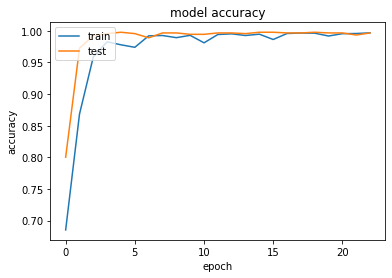

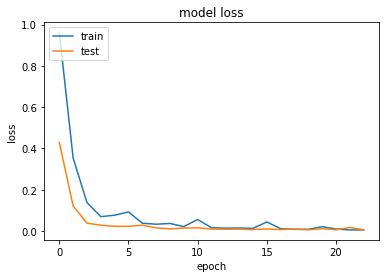

In [129]:
# summarize history for accuracy
plt.plot(history_cnn.history['acc'])
plt.plot(history_cnn.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_cnn.history['loss'])
plt.plot(history_cnn.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [149]:
#Curva Roc

In [131]:
clases_cnn = model_cnn.predict_classes(X_test)

In [132]:
cm_cnn= confusion_matrix(Y_test.argmax(axis=1), clases_cnn)

La matriz de confusion sin normalizar
[[379   2]
 [  1 529]]


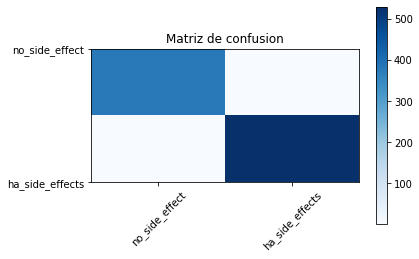

In [134]:
cm_plot_label = ['no_side_effect','ha_side_effects']
plot_confusion_matrix(cm_cnn, cm_plot_label, title='Matriz de confusion')

In [135]:
probs_cnn = model_cnn.predict_proba(X_test)

In [138]:
probs_cnn = probs_cnn[:, 1]

In [139]:
auc_cnn = roc_auc_score(Y_test.argmax(axis=1), probs_cnn)

In [140]:
fpr, tpr, thresholds = roc_curve(Y_test.argmax(axis=1), probs_cnn)

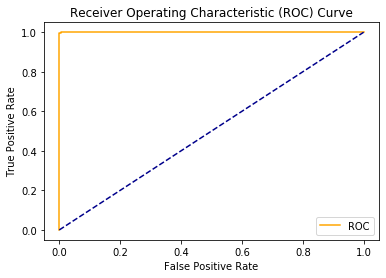

In [141]:
plot_roc_curve(fpr, tpr)

In [96]:
#PARA VOLVER A ENTRENAR
#model_cnn.fit(X_train, Y_train,
#          batch_size=32,
#          epochs=10,
#          verbose=1,
#          validation_data=(X_test, Y_test))
#score = model_cnn.evaluate(X_test, Y_test, verbose=0)
#print('Test loss:', score[0])
#print('Test accuracy:', score[1])

# Red neuronal extraida de paper para reconcimiento de arandanos

In [255]:
model_aran = Sequential()

model_aran.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(100, 100, 3)))
model_aran.add(MaxPooling2D(pool_size=(2,2)))
model_aran.add(Conv2D(64, kernel_size=(3,3), activation='relu'))
model_aran.add(MaxPooling2D(pool_size=(2,2)))
model_aran.add(Flatten())
model_aran.add(Dense(128, activation='relu'))
model_aran.add(Dropout(0.25))
model_aran.add(Dense(2, activation='softmax'))



model_aran.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_15 (Conv2D)           (None, 98, 98, 32)        896       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 47, 47, 64)        18496     
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 23, 23, 64)        0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 33856)             0         
_________________________________________________________________
dense_66 (Dense)             (None, 128)               4333696   
_________________________________________________________________
dropout_51 (Dropout)         (None, 128)               0         
__________

In [256]:
model_aran.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

history_aran= model_aran.fit(X_train, Y_train,
          batch_size=64,
          epochs=10,
          verbose=1,
          validation_data=(X_test, Y_test))
score = model_aran.evaluate(X_test, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 3805 samples, validate on 911 samples
Epoch 1/10
3805/3805 [==============================] - 74s 19ms/step - loss: 0.5920 - acc: 0.7656 - val_loss: 0.1081 - val_acc: 0.9671
Epoch 2/10
3805/3805 [==============================] - 72s 19ms/step - loss: 0.1461 - acc: 0.9540 - val_loss: 0.0393 - val_acc: 0.9890
Epoch 3/10
3805/3805 [==============================] - 72s 19ms/step - loss: 0.0721 - acc: 0.9769 - val_loss: 0.0236 - val_acc: 0.9956
Epoch 4/10
3805/3805 [==============================] - 72s 19ms/step - loss: 0.0535 - acc: 0.9832 - val_loss: 0.0164 - val_acc: 0.9967
Epoch 5/10
3805/3805 [==============================] - 72s 19ms/step - loss: 0.0285 - acc: 0.9911 - val_loss: 0.0221 - val_acc: 0.9956
Epoch 6/10
3805/3805 [==============================] - 72s 19ms/step - loss: 0.0230 - acc: 0.9934 - val_loss: 0.0475 - val_acc: 0.9802
Epoch 7/10
3805/3805 [==============================] - 72s 19ms/step - loss: 0.0223 - acc: 0.9919 - val_loss: 0.0088 - val_acc: 0.9978
E

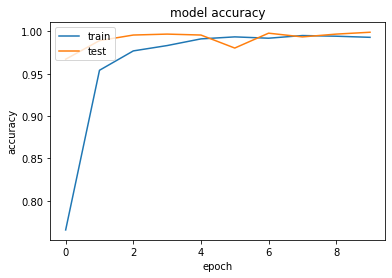

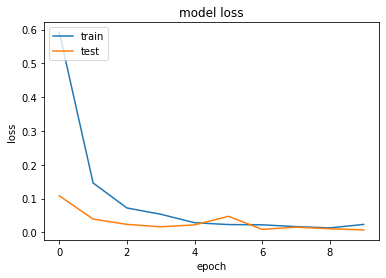

In [257]:
# summarize history for accuracy
plt.plot(history_aran.history['acc'])
plt.plot(history_aran.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_aran.history['loss'])
plt.plot(history_aran.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [258]:
predict_clases = model_aran.predict_classes(X_test)
prediccion = model_aran.predict(X_test)

In [259]:
cm_aran= confusion_matrix(Y_test.argmax(axis=1), predict_clases)

La matriz de confusion sin normalizar
[[380   1]
 [  0 530]]


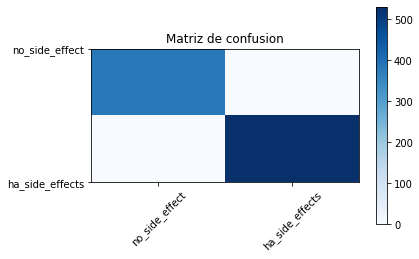

In [260]:
cm_plot_label = ['no_side_effect','ha_side_effects']
plot_confusion_matrix(cm_aran, cm_plot_label, title='Matriz de confusion')

In [272]:
probs = model_aran.predict_proba(X_test)

In [273]:
probs = probs[:, 1]

In [274]:
auc = roc_auc_score(Y_test.argmax(axis=1), probs)

In [269]:
print('AUC: %.2f' % auc)

AUC: 0.00


In [275]:
fpr, tpr, thresholds = roc_curve(Y_test.argmax(axis=1), probs)

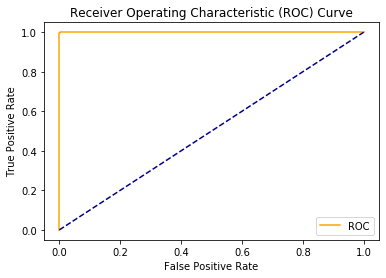

In [276]:
plot_roc_curve(fpr, tpr)

# Segunda Red utilizanda para arandanos (paper 2)

In [23]:
model_fruit = Sequential()

model_fruit.add(Conv2D(32, kernel_size=(3, 3), input_shape=(100, 100, 3)))

model_fruit.add(Conv2D(32,(3,3), activation='relu'))
model_fruit.add(MaxPooling2D(pool_size=(2,2)))
model_fruit.add(Conv2D(64,(3,3),activation='relu'))
model_fruit.add(Conv2D(64,(3,3),activation='relu'))
model_fruit.add(Dropout(0.25))
model_fruit.add(MaxPooling2D(pool_size=(2,2)))
model_fruit.add(Conv2D(128,(3,3),activation='relu'))
model_fruit.add(Conv2D(128,(3,3),activation='relu'))
model_fruit.add(Conv2D(128,(3,3),activation='relu'))
model_fruit.add(MaxPooling2D(pool_size=(2,2)))
model_fruit.add(Conv2D(256,(3,3),activation='relu'))
model_fruit.add(Conv2D(256,(3,3),activation='relu'))
model_fruit.add(Conv2D(256,(3,3),activation='relu'))
model_fruit.add(MaxPooling2D(pool_size=(2,2)))
model_fruit.add(Dropout(0.25))
model_fruit.add(Conv2DTranspose(512,(3,3), activation='relu'))
model_fruit.add(Flatten())
model_fruit.add(Dense(2, activation='softmax'))

model_fruit.summary()






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 98, 98, 32)        896       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 96, 96, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 48, 48, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 46, 46, 64)        18496     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 44, 44, 64)        36928     
_________________________________________________________________
dropout_1 (Dropout)          (None, 44, 44, 64)        0         
______________________

In [24]:
model_fruit.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

history_fruit= model_fruit.fit(X_train, Y_train,
          batch_size=64,
          epochs=10,
          verbose=1,
          validation_data=(X_test, Y_test))
score = model_fruit.evaluate(X_test, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 3805 samples, validate on 911 samples
Epoch 1/10
3805/3805 [==============================] - 23s 6ms/step - loss: 0.6865 - acc: 0.5837 - val_loss: 0.6754 - val_acc: 0.5818
Epoch 2/10
3805/3805 [==============================] - 11s 3ms/step - loss: 0.7057 - acc: 0.6368 - val_loss: 6.5298 - val_acc: 0.5818
Epoch 3/10
3805/3805 [==============================] - 11s 3ms/step - loss: 0.7547 - acc: 0.6959 - val_loss: 0.2277 - val_acc: 0.9616
Epoch 4/10
3805/3805 [==============================] - 11s 3ms/step - loss: 0.1981 - acc: 0.9293 - val_loss: 0.0771 - val_acc: 0.9715
Epoch 5/10
3805/3805 [==============================] - 11s 3ms/step - loss: 0.1618 - acc: 0.9537 - val_loss: 0.1393 - val_acc: 0.9671
Epoch 6/10
3805/3805 [==============================] - 11s 3ms/step - loss: 0.0554 - acc: 0.9827 - val_loss: 0.0334 - val_acc: 0.9956
Epoch 7/10
3805/3805 [=========================

In [25]:
#Matriz de confusion

In [26]:
prediccion_fruit = model_fruit.predict_classes(X_test)

In [27]:
cm_fruit = confusion_matrix(Y_test.argmax(axis=1), prediccion_fruit)

La matriz de confusion sin normalizar
[[380   1]
 [ 24 506]]


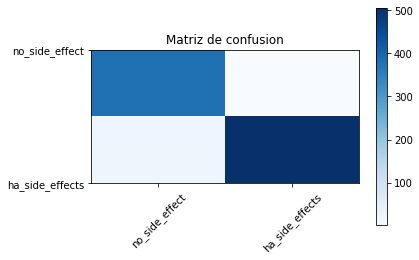

In [29]:
cm_plot_label = ['no_side_effect','ha_side_effects']
plot_confusion_matrix(cm_fruit, cm_plot_label, title='Matriz de confusion')

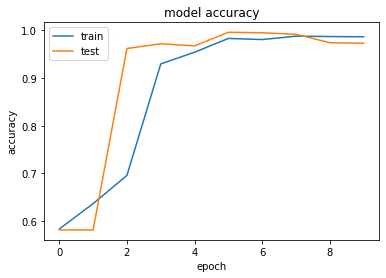

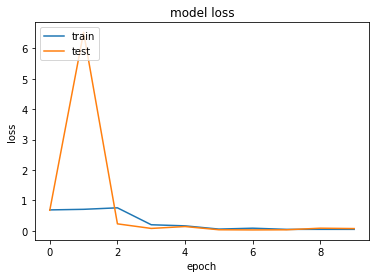

In [30]:
# summarize history for accuracy
plt.plot(history_fruit.history['acc'])
plt.plot(history_fruit.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_fruit.history['loss'])
plt.plot(history_fruit.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [31]:
probs_fruit = model_fruit.predict_proba(X_test)

In [33]:
probs_fruit = probs_fruit[:, 1]

In [34]:
auc_fruit = roc_auc_score(Y_test.argmax(axis=1), probs_fruit)

In [35]:
fpr, tpr, thresholds = roc_curve(Y_test.argmax(axis=1), probs_fruit)

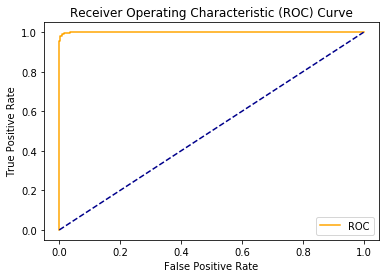

In [36]:
plot_roc_curve(fpr, tpr)

# Modelo de red utilizado para Hojas de tomate, (Adaptado)

In [58]:
model_tomaco = Sequential()

model_tomaco.add(Conv2D(128, kernel_size=(3, 3), input_shape=(100, 100, 3)))
model_tomaco.add(Conv2D(64,(3,3), activation='relu'))
model_tomaco.add(MaxPooling2D())
model_tomaco.add(MaxPooling2D())
model_tomaco.add(BatchNormalization())

model_tomaco.add(Conv2D(64,(3,3), activation='relu'))
model_tomaco.add(Conv2D(64,(3,3), activation='relu'))
model_tomaco.add(Conv2D(64,(3,3), activation='relu'))
model_tomaco.add(MaxPooling2D())
model_tomaco.add(MaxPooling2D())
model_tomaco.add(MaxPooling2D())
model_tomaco.add(BatchNormalization())
#model_tomaco.add(Reshape())
model_tomaco.add(Flatten())
model_tomaco.add(Dense(2, activation='softmax'))



#REDUCE DEMACIADO EL TAMA;O DE LA IMAGEN

#model_tomaco.add(Conv2D(64,(3,3)))
#model_tomaco.add(MaxPooling2D(pool_size=(2,2)))
#model_tomaco.add(BatchNormalization())
#model_tomaco.add(AveragePooling2D())
#model_tomaco.add(Conv2D(64,(3,3), activation='relu'))
#model_tomaco.add(Lambda())
#model_tomaco.add(Conv2D(32,(3,3), activation='relu'))
#model_tomaco.add(Reshape())

model_tomaco.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_115 (Conv2D)          (None, 98, 98, 128)       3584      
_________________________________________________________________
conv2d_116 (Conv2D)          (None, 96, 96, 64)        73792     
_________________________________________________________________
max_pooling2d_103 (MaxPoolin (None, 48, 48, 64)        0         
_________________________________________________________________
max_pooling2d_104 (MaxPoolin (None, 24, 24, 64)        0         
_________________________________________________________________
batch_normalization_39 (Batc (None, 24, 24, 64)        256       
_________________________________________________________________
conv2d_117 (Conv2D)          (None, 22, 22, 64)        36928     
_________________________________________________________________
conv2d_118 (Conv2D)          (None, 20, 20, 64)        36928     
__________

In [59]:
model_tomaco.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

In [60]:
history_tomaco= model_tomaco.fit(X_train, Y_train,
          batch_size=64,
          epochs=10,
          verbose=1,
          validation_data=(X_test, Y_test))
score = model_tomaco.evaluate(X_test, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 3805 samples, validate on 911 samples
Epoch 1/10
3805/3805 [==============================] - 118s 31ms/step - loss: 0.0856 - acc: 0.9648 - val_loss: 0.1240 - val_acc: 0.9462
Epoch 2/10
3805/3805 [==============================] - 93s 24ms/step - loss: 0.0254 - acc: 0.9916 - val_loss: 0.5765 - val_acc: 0.8332
Epoch 3/10
3805/3805 [==============================] - 92s 24ms/step - loss: 0.0250 - acc: 0.9903 - val_loss: 0.6443 - val_acc: 0.7936
Epoch 4/10
3805/3805 [==============================] - 92s 24ms/step - loss: 0.0123 - acc: 0.9958 - val_loss: 0.2610 - val_acc: 0.8825
Epoch 5/10
3805/3805 [==============================] - 93s 25ms/step - loss: 0.0100 - acc: 0.9966 - val_loss: 0.1970 - val_acc: 0.9352
Epoch 6/10
3805/3805 [==============================] - 101s 26ms/step - loss: 0.0126 - acc: 0.9966 - val_loss: 2.9223 - val_acc: 0.5093
Epoch 7/10
3805/3805 [==============================] - 160s 42ms/step - loss: 0.0053 - acc: 0.9974 - val_loss: 0.4325 - val_acc: 0.894

In [102]:
#Matriz de confusion

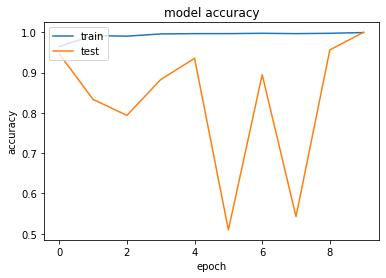

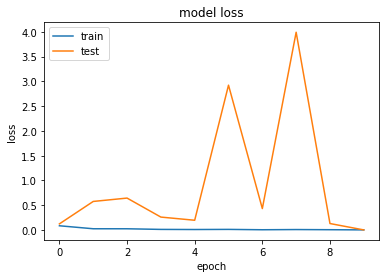

In [61]:
# summarize history for accuracy
plt.plot(history_tomaco.history['acc'])
plt.plot(history_tomaco.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_tomaco.history['loss'])
plt.plot(history_tomaco.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

La matriz de confusion sin normalizar
[[381   0]
 [  0 530]]


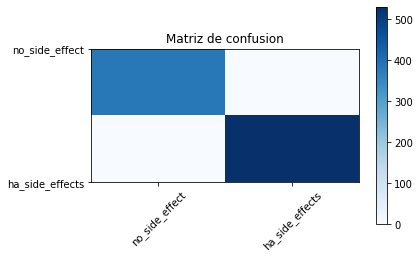

In [62]:
prediccion_tomaco = model_tomaco.predict_classes(X_test)
cm_tomaco = confusion_matrix(Y_test.argmax(axis=1), prediccion_tomaco)
cm_plot_label = ['no_side_effect','ha_side_effects']
plot_confusion_matrix(cm_tomaco, cm_plot_label, title='Matriz de confusion')

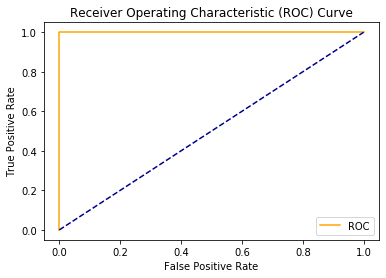

In [63]:
probs_tomaco = model_tomaco.predict_proba(X_test)
probs_tomaco = probs_tomaco[:, 1]
auc_tomaco = roc_auc_score(Y_test.argmax(axis=1), probs_tomaco)
fpr_tomaco, tpr_tomaco, thresholds = roc_curve(Y_test.argmax(axis=1), probs_tomaco)
plot_roc_curve(fpr_tomaco, tpr_tomaco)